# imports 

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["figure.dpi"] = 125
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})
plt.rcParams['image.cmap'] = 'gray' # grayscale looks better
from pathlib import Path
import numpy as np
import pandas as pd
import os
from skimage.io import imread as imread
from skimage.util import montage
from PIL import Image
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
from skimage.color import label2rgb

# Dict for easy labeling

In [17]:
dx_name_dict = {
    'nv': 'melanocytic nevi',
    'mel': 'melanoma',
    'bcc': 'basal cell carcinoma',
    'akiec': 'Actinic keratoses and intraepithelial carcinoma',
    'vasc': 'vascular lesions',
    'bkl': 'benign keratosis-like',
    'df': 'dermatofibroma'
}
dx_name_id_dict = {id: name for id, name in enumerate(dx_name_dict.values())}

# Import and encode the data, encode because we are turning images to vectors

In [18]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse=False)

color_file = Path(r'C:\Users\Jay\Documents\FlatironDataSci\archive\color_features.json')
color_feat_df = pd.read_json(color_file)
color_feat_df['dx_vec'] = [x for x in ohe.fit_transform(color_feat_df['dx_id'].values.reshape(-1, 1))]
color_feat_df.sample(2)

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features,dx_vec
5422,HAM_0005346,ISIC_0028171,nv,follow_up,75,male,lower extremity,C:\Users\Jay\Documents\FlatironDataSci\archive...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]"
246,HAM_0001384,ISIC_0033414,bkl,histo,70,male,back,C:\Users\Jay\Documents\FlatironDataSci\archive...,benign keratosis-like,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]"


# Train Test Split

In [19]:
from sklearn.model_selection import train_test_split
train_df, valid_df = train_test_split(color_feat_df, 
                 test_size = 0.2, 
                 random_state=2019,
                  # hack to make stratification work                  
                 stratify = color_feat_df['dx_name'])
train_df.reset_index(inplace=True)
valid_df.reset_index(inplace=True)
print(train_df.shape[0], 'training images')
print(valid_df.shape[0], 'validation images')

7966 training images
1992 validation images


# Turn Train Test Split Into NP stack so matrix mul can happen

In [20]:
train_x_vec = np.stack(train_df['color_features'].values, 0)
train_y_vec = np.stack(train_df['dx_vec'], 0)
print(train_x_vec.shape, '->', train_y_vec.shape)
valid_x_vec = np.stack(valid_df['color_features'].values, 0)
valid_y_vec = np.stack(valid_df['dx_vec'], 0)
print(valid_x_vec.shape, '->', valid_y_vec.shape)

(7966, 255) -> (7966, 7)
(1992, 255) -> (1992, 7)


# Pretty Graphs

In [21]:
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score
def show_model_results(in_model, use_split='valid', plot_type='swarm'):
    if use_split=='valid':
        x_vec = valid_x_vec
        y_vec = valid_y_vec
        example_df = valid_df
    elif use_split=='train':
        x_vec = train_x_vec
        y_vec = train_y_vec
        example_df = train_df
    else:
        raise ValueError('Unknown split: {}'.format(use_split))
    
    valid_pred = in_model.predict(x_vec)
    fig, m_axs = plt.subplots(4, 2, figsize=(20, 40))
    all_rows = []
    ax1 = m_axs[0,0]
    print(y_vec.shape, valid_pred.shape)
    for i, c_dx in dx_name_id_dict.items():
        tpr, fpr, _ = roc_curve(y_vec[:, i], valid_pred[:, i])
        auc = roc_auc_score(y_vec[:, i], valid_pred[:, i])
        acc = accuracy_score(y_vec[:, i], valid_pred[:, i]>0.5)
        ax1.plot(tpr, fpr, '.-', label='{}: AUC {:0.2f}, Accuracy: {:2.0%}'.format(c_dx, auc, acc))
        all_rows+=[{'dx_name': c_dx, 
                    'prediction': valid_pred[j, i], 
                    'class': 'Positive' if y_vec[j, i]>0.5 else 'Negative'} 
                         for j in range(valid_pred.shape[0])]
    
    d_ax = m_axs[0, 1]
    t_yp = np.mean(valid_pred, 0)
    t_y = np.mean(y_vec, 0)
    d_ax.barh(np.arange(len(dx_name_id_dict))+0.1, t_yp, alpha=0.5, label='Predicted')
    d_ax.barh(np.arange(len(dx_name_id_dict))-0.1, t_y+0.001, alpha=0.5, label='Ground Truth')
    d_ax.set_xlim(0, 1)
    d_ax.set_yticks(range(len(dx_name_id_dict)))
    d_ax.set_yticklabels(dx_name_id_dict.values(), rotation=0)
    d_ax.set_title('Overall')
    d_ax.legend()
    
    # show example images
    ax1.legend()
    for (_, c_row), (c_ax, d_ax) in zip(
        example_df.sample(m_axs.shape[0]).iterrows(), 
                               m_axs[1:]):
        
        c_ax.imshow(imread(c_row['image_path']))
        c_ax.set_title(c_row['dx_name'])
        c_ax.axis('off')
        t_yp = in_model.predict(np.expand_dims(c_row['color_features'], 0))
        t_y = np.array(c_row['dx_vec'])
        d_ax.barh(np.arange(len(dx_name_id_dict))+0.1, t_yp[0], alpha=0.5, label='Predicted')
        d_ax.barh(np.arange(len(dx_name_id_dict))-0.1, t_y+0.001, alpha=0.5, label='Ground Truth')
        d_ax.set_yticks(range(len(dx_name_id_dict)))
        d_ax.set_yticklabels(dx_name_id_dict.values(), rotation=0)
        d_ax.set_xlim(0, 1)
        d_ax.legend();
    
    # nice dataframe of output
    c_all_df = pd.DataFrame(all_rows)
    fig, ax1 = plt.subplots(1, 1, figsize=(12, 5))
    if plot_type=='swarm':
        sns.swarmplot(data=c_all_df, hue='class', y='prediction', x='dx_name', size=2.0, ax=ax1)
    elif plot_type=='box':
        sns.boxplot(data=c_all_df, hue='class', y='prediction', x='dx_name', ax=ax1)
    ax1.set_ylim(-0.05, 1.05)
    return c_all_df

# KNN

In [22]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=1)
knn.fit(train_x_vec, train_y_vec)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=1, p=2,
          weights='uniform')

(7966, 7) (7966, 7)


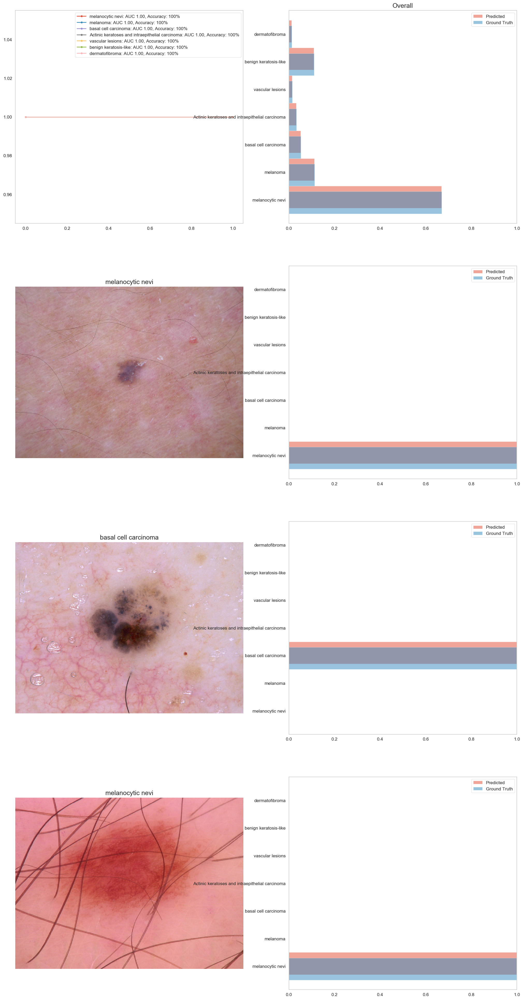

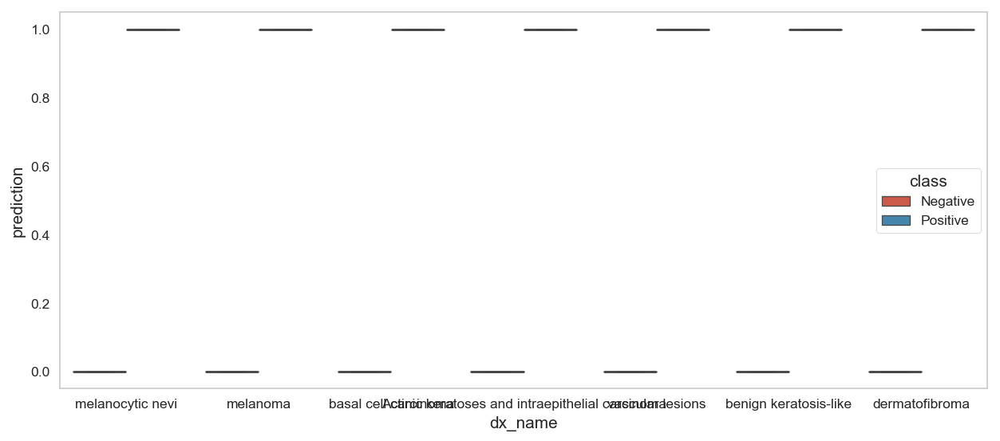

In [23]:
show_model_results(knn, use_split='train', plot_type='box');

# pretty graph

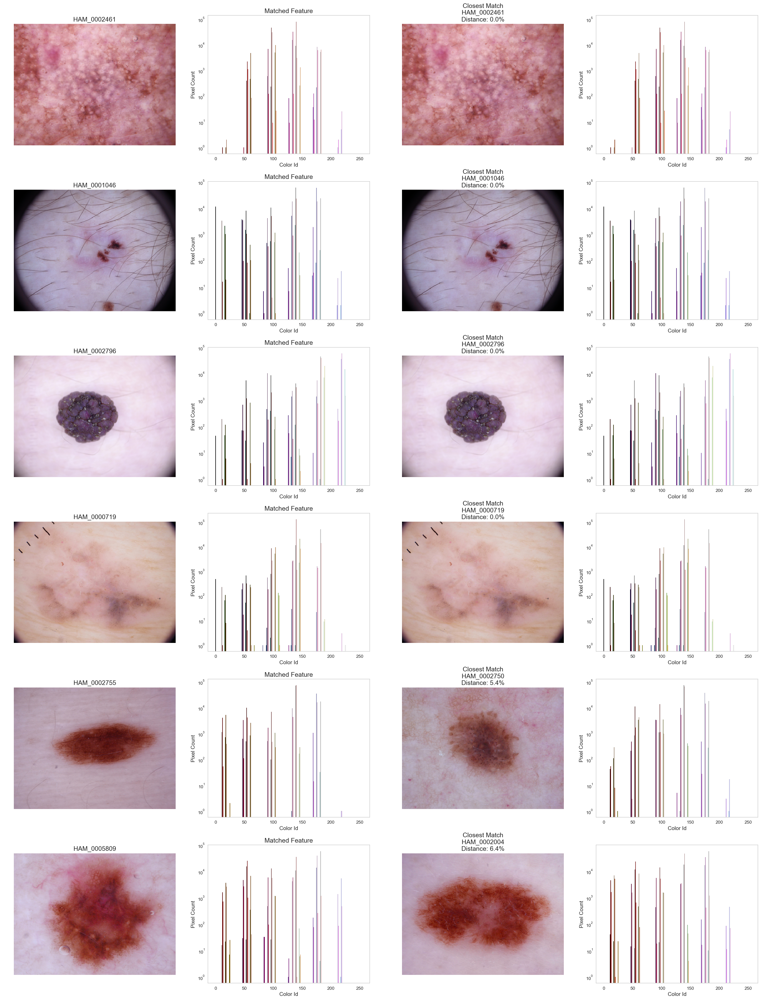

In [24]:
fig, m_axs = plt.subplots(6, 4, figsize=(30, 40))
dummy_web_image = Image.new(size=(1,1), mode='RGB').convert('P', palette='web')

for (c_ax, c_feat_ax, d_ax, d_feat_ax), (_, c_row) in zip(m_axs, 
                            color_feat_df.sample(m_axs.shape[0], random_state=2018).iterrows()):
    
    query_img = Image.open(c_row['image_path'])
    idx_to_color = np.array(query_img.convert('P', palette='web').getpalette()).reshape((-1, 3))/255.0
    c_ax.imshow(query_img)
    c_ax.set_title(c_row['lesion_id'][:25])
    c_ax.axis('off')
    counts, bins = np.histogram(np.ravel(query_img.convert('P', palette='web')), 
                                bins=np.arange(256))
    
    for i in range(counts.shape[0]):
        c_feat_ax.bar(bins[i], counts[i], color=idx_to_color[i], edgecolor='k', linewidth=0.1)
    c_feat_ax.set_yscale('log')
    c_feat_ax.set_xlabel('Color Id')
    c_feat_ax.set_ylabel('Pixel Count')
    c_feat_ax.set_title('Feature Vector')
    
    dist, idx = knn.kneighbors(np.expand_dims(c_row['color_features'], 0))
    m_row = train_df.iloc[idx[0][0]]
    matched_img = Image.open(m_row['image_path'])
    
    d_ax.imshow(matched_img)
    d_ax.set_title('Closest Match\n{}\nDistance: {:2.1%}'.format(m_row['lesion_id'][:25], dist[0][0]))
    d_ax.axis('off')
    
    counts, bins = np.histogram(np.ravel(matched_img.convert('P', palette='web')), 
                                bins=np.arange(256))
    
    for i in range(counts.shape[0]):
        d_feat_ax.bar(bins[i], counts[i], color=idx_to_color[i], edgecolor='k', linewidth=0.1)
    d_feat_ax.set_yscale('log')
    d_feat_ax.set_xlabel('Color Id')
    d_feat_ax.set_ylabel('Pixel Count')
    c_feat_ax.set_title('Matched Feature')

(1992, 7) (1992, 7)


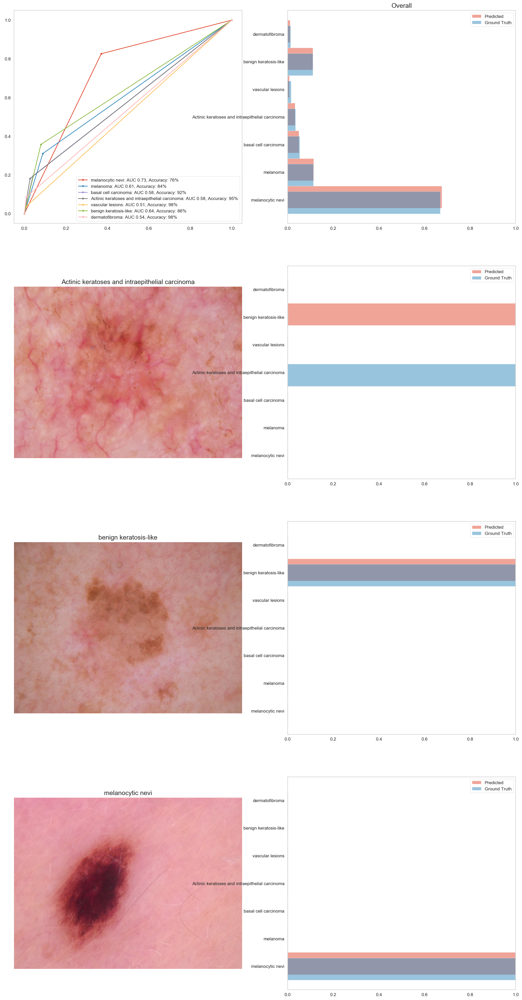

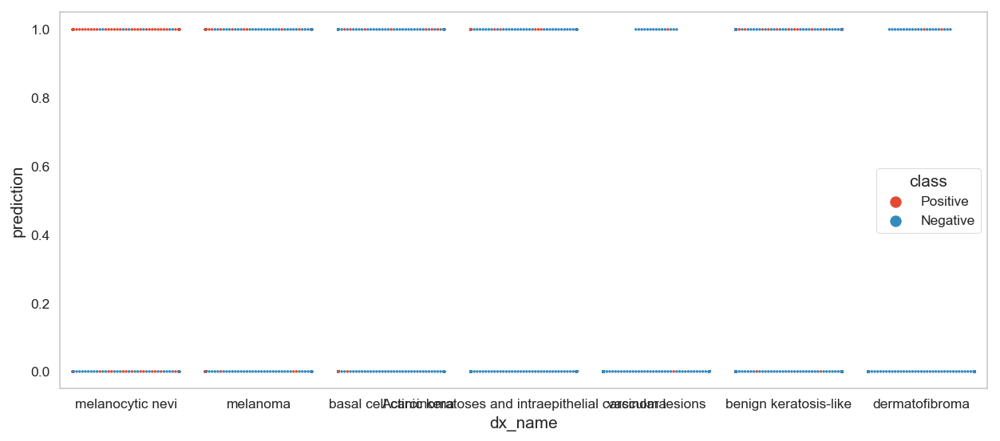

In [25]:
show_model_results(knn, use_split='valid');